# Data and Libraries

In [ ]:
import sys
sys.path.append('')
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
import sklearn
from scipy.stats import probplot
from sklearn.metrics import mean_absolute_error

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

In [ ]:
if 'google.colab' in sys.modules:
    ! pip install -q dtreeviz
import dtreeviz

In [ ]:
df = pd.read_excel('./adverts.xlsx')

In [ ]:
df.head(4)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel


In [ ]:
df.shape

(402005, 12)

# Preliminary Task

## Data Description and Pre-Processing

The fields "public_reference," "reg_code," and "standard_model" have been excluded from the dataset for the following reasons:

1. "public_reference" does not provide any significant insights.
2. "reg_code" is redundant since there is already another feature, "year_of_registration," that captures the necessary information. Including "reg_code" would only complicate the dataset without adding value.
3. "standard_model" has been excluded due to its high dimensionality, which makes the model overly complex.

By omitting these features, we aim to simplify the dataset while retaining its effectiveness.

In [ ]:
df = df.drop(columns = ["public_reference", "reg_code", "standard_model"], inplace=False, axis = 1)

The process of handling auditory distractions involves the removal of specific data entries. Specifically, in the "price" column, any rows where the price is equal to 999999 have been eliminated from the dataset.

In [ ]:
indices_to_drop = df.loc[df['price'] == 9999999].index
df.drop(indices_to_drop, inplace= True)

In [ ]:
df.shape

(401999, 9)

Imputation strategies are critical in the context of handling missing data in datasets. Unlike standard imputation methods that apply a one-size-fits-all approach, the strategies outlined here are specifically designed to align with the unique requirements and characteristics of the dataset in question. By tailoring imputation methods to the dataset, we can enhance the quality of the data and improve the accuracy of subsequent analyses. This targeted approach ensures that the imputation process respects the underlying patterns and relationships present in the data, ultimately leading to more reliable and meaningful results.

Missing values in the "standard_colour" column are addressed based on the "body_type" column. For instance, if a "standard_colour" value is missing and the corresponding "body_type" is 'SUV', it should be replaced with 'Black'. Not only this is domain-informed, but also context-aware.

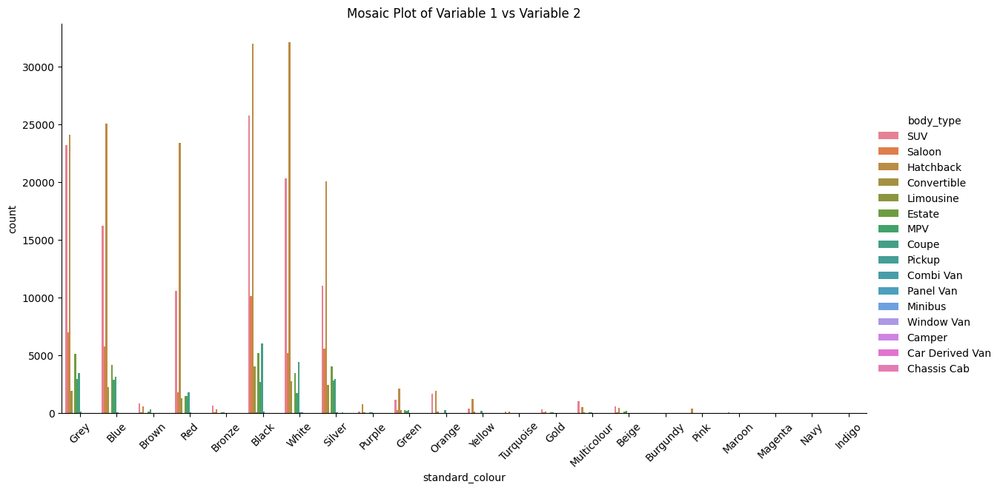

In [ ]:
g = sns.catplot(x='standard_colour', hue='body_type', kind='count', data=df, height=6, aspect=2)
plt.title('Mosaic Plot of Variable 1 vs Variable 2')


plt.xticks(rotation=45)
plt.show()

In [ ]:
body_type_to_color = {
    'SUV': 'Black',
    'Saloon': 'Black',
    'Hatchback': 'White',
    'Convertible': 'Black',
    'Limousine': 'Black',
    'Estate': 'Black',
    'MPV': 'Grey',
    'Coupe': 'Black'
}

def replace_nan_with_custom_color(row):
    if pd.isna(row['standard_colour']):
        return body_type_to_color.get(row['body_type'], df['standard_colour'].mode()[0])
    else:
        return row['standard_colour']

df['standard_colour'] = df.apply(replace_nan_with_custom_color, axis = 1)

df['standard_colour'].isnull().sum()

np.int64(0)

In [ ]:
df.shape

(401999, 9)

2- Establishing an imputation strategy that offers greater flexibility compared to standard methods, such as the "simple imputer." In this approach, missing values are replaced based on the values from another column. Specifically, the missing value in the "body_type" column is imputed using the mode of the corresponding values from the other column associated with it. This process is exclusively applied to the "body_type" column.

In [ ]:
def def_imputation(df, imput_col, target_col):

    for make in df[imput_col].unique():

        mode_target_col = df[df[imput_col] == make][target_col].mode()

        if mode_target_col.empty:
            mode_target_col = df[target_col].mode()[0]
        else:
            mode_target_col = mode_target_col[0]

        df.loc[(df[imput_col] == make) & (df[target_col].isnull()), target_col] = mode_target_col

    return df

In [ ]:
df = def_imputation(df, 'body_type', 'standard_make')
df = def_imputation(df, 'fuel_type', 'standard_make')
df = df.reset_index(drop=True)

Dealing with outliers:

Outliers in categorical features have been addressed by removing rows that contain categories with fewer than 250 occurrences. This approach not only mitigates the risk of less significant categories skewing the results but also aids in the efficient execution of computationally intensive models.

In [ ]:
for category_column in ["standard_colour", "body_type", "fuel_type", "standard_make", "year_of_registration", "mileage"]:
    category_counts = df[category_column].value_counts()
    valid_categories = category_counts[category_counts >= 250].index
    df = df[df[category_column].isin(valid_categories)]

Outliers are addressed in a tailored manner for each column of the dataset. Specifically, for the categorical variables "standard_colour", "standard_make", and "body_type", we limit our analysis to the ten most frequently occurring categories, with all other categories being grouped into an "Other" classification. This approach is beneficial for a couple of reasons.

First, it facilitates the implementation of one-hot encoding, allowing us to manage dimensionality effectively and reduce the complexity of our dataset. Secondly, by consolidating less frequent categories, we aim to enhance the performance of regression models, as they tend to yield better results with a more focused set of categories. This strategy underscores the importance of thoughtful preprocessing in improving model accuracy and interpretability.

In [ ]:
for column in ["standard_colour", "standard_make", "body_type"]:
    top_10_categories = df[column].value_counts().nlargest(9).index
    df[column] = df[column].apply(lambda x: x if x in top_10_categories else 'Other')

In [ ]:
X = df.copy()  # X includes everything, including "price". 'price' is not dropped from X here so that it can be used in the upcoming pipeline for target encoding.
y = df[["price"]]

In [ ]:
X.shape

(104757, 9)

**Pipleline for preprocessing**

Two reusable functions have been developed to establish a pipeline for preprocessing both categorical and numeric features. Users have the flexibility to select their preferred methods for encoding, imputation, and scaling according to their specific needs.

Available options for categorical features:  

Encoding Methods:
One-Hot Encoding, Ordinal Encoding, Label Encoding, Binary Encoding, Target Encoding (Mean Encoding), Frequency / Count Encoding, Hash Encoding

Missing Values Methods:
Most Frequent Imputation, Constant Imputation

In [ ]:
! pip install category_encoders

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from category_encoders import TargetEncoder, BinaryEncoder, CountEncoder
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder


def create_cat_pp_ppln(df, encode_method=None, drop_if_binary=False, target=None, impute_strategy=None, fill_value=None):


    # categorical_features = df.select_dtypes(include='object').columns.tolist()


    # Imputating
    if impute_strategy == 'constant':
        imputer = ("imputer", SimpleImputer(strategy="constant", fill_value=fill_value))

    elif impute_strategy == 'most_frequent':
        imputer = ("imputer", SimpleImputer(strategy="most_frequent"))


    # Encoding
    if encode_method == 'onehot':
        if drop_if_binary == True:
            encoder = ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=False, drop='if_binary'))
        else:
           encoder = ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=False))

    elif encode_method == 'ordinal':
        encoder = ("encoder", OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))

    elif encode_method == 'target':
        if target is None:
            raise ValueError("Target variable required for target encoding.")
        encoder = ("encoder", Pipeline([
                        ("target_encoder", TargetEncoder()),
                        ("minmax_scaler", MinMaxScaler())
                        ]))

    elif encode_method == 'binary':
        encoder = ("encoder", BinaryEncoder())

    elif encode_method == 'count':
        encoder = ("encoder", CountEncoder())

    else:
        raise ValueError(f"Unknown encoding method: {encode_method}")


    # Build pipeline
    if impute_strategy:
         categorical_transformer = Pipeline(steps=[imputer, encoder])
    else:
         categorical_transformer = Pipeline(steps=[encoder])

    return categorical_transformer

Creating pipelines for each categorical feature:

In [ ]:
ppln_1 = create_cat_pp_ppln(X[["standard_colour"]], encode_method='onehot')
ppln_2 = create_cat_pp_ppln(X[["standard_make"]], encode_method='onehot', impute_strategy='most_frequent')
ppln_3 = create_cat_pp_ppln(X[["body_type"]], encode_method='onehot')
ppln_4 = create_cat_pp_ppln(X[["vehicle_condition"]], encode_method='onehot', drop_if_binary=True, impute_strategy='most_frequent')
ppln_5 = create_cat_pp_ppln(X[["crossover_car_and_van"]], encode_method='onehot', drop_if_binary=True)
ppln_6 = create_cat_pp_ppln(X[["fuel_type"]], encode_method='target', target='price')

Defining a functuion for creating pipline for numeric features.

Available options for numeric options:

Imputation Methods: Constant Imputation, Median Imputation, Mean Imputation

Scaling Methods: Standard Scaling (Standardization), Min-Max Scaling (Normalization)

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler


def create_num_pp_ppln(df, scale_method=None, impute_strategy=None, fill_value=None):


    numeric_features = df.select_dtypes(include='number').columns.tolist()


    # Imputating
    if impute_strategy == 'constant':
        imputer = ("imputer", SimpleImputer(strategy="constant", fill_value=fill_value))

    elif impute_strategy == 'median':
        imputer = ("imputer", SimpleImputer(strategy="median"))

    elif impute_strategy == 'mean':
        imputer = ("imputer", SimpleImputer(strategy="mean"))

    elif impute_strategy == 'mode':
        imputer = ("imputer", SimpleImputer(strategy="most_frequent"))


    # Scaling
    if scale_method == 'standard':
            encoder = ("standard", StandardScaler())

    elif scale_method == 'minmax':
        encoder = ("encoder", MinMaxScaler())


    # Build pipeline
    if impute_strategy:
         numeric_transformer = Pipeline(steps=[imputer, encoder])
    else:
         numeric_transformer = Pipeline(steps=[encoder])

    return numeric_transformer

Creating pipelines for each numeric feature:

In [ ]:
ppln_7 = create_num_pp_ppln(X[["mileage"]], scale_method='minmax', impute_strategy='median')
ppln_8 = create_num_pp_ppln(X[["year_of_registration"]], scale_method='minmax', impute_strategy='mode')
ppln_9 = create_num_pp_ppln(X[["price"]], scale_method='minmax')

In [ ]:
from sklearn.compose import make_column_selector

Implementing all pipelines in one place, in addition to keeping the previous names of features for newley generated features

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ("ppln_1", ppln_1, ["standard_colour"]),
        ("ppln_2", ppln_2, ["standard_make"]),
        ("ppln_3", ppln_3, ["body_type"]),
        ("ppln_4", ppln_4, ["vehicle_condition"]),
        ("ppln_5", ppln_5, ["crossover_car_and_van"]),
        ("ppln_6", ppln_6, ["fuel_type"]),
        ("ppln_7", ppln_7, ["mileage"]),
        ("ppln_8", ppln_8, ["year_of_registration"]),
        ("ppln_9", ppln_9, ["price"])
    ],
    verbose_feature_names_out = False
)


preprocessor.fit(X, y)


X_transformed = preprocessor.transform(X)


feature_names = preprocessor.get_feature_names_out()
X_transformed = pd.DataFrame(X_transformed, columns=feature_names, index=X.index)
X_transformed.rename(columns={0: "fuel_type"}, inplace=True)

In [ ]:
y = X_transformed["price"]
X = X_transformed.drop(columns=["price"])

In [ ]:
X.tail(10)

,standard_colour_Black,standard_colour_Blue,standard_colour_Brown,standard_colour_Green,standard_colour_Grey,standard_colour_Orange,standard_colour_Other,standard_colour_Red,standard_colour_Silver,standard_colour_White,...,body_type_Hatchback,body_type_MPV,body_type_Pickup,body_type_SUV,body_type_Saloon,vehicle_condition_USED,crossover_car_and_van_True,fuel_type,mileage,year_of_registration
401976,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.233708,0.615385,0.619048
401977,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.338462,0.571429
401983,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.000000,0.446154,0.857143
401984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.376923,0.761905
401985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.000000,0.938462,0.380952
401986,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.384615,0.380952
401987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.000000,0.338462,0.761905
401990,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.346154,0.761905
401995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.846154,0.476190
401998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.037157,0.107692,0.714286


In [ ]:
X.shape

(104757, 33)

In [ ]:
y.head()

,price
3,0.006563
4,0.022398
5,0.024069
7,0.020298
10,0.003650


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 104757 entries, 3 to 401998
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   standard_colour_Black        104757 non-null  float64
 1   standard_colour_Blue         104757 non-null  float64
 2   standard_colour_Brown        104757 non-null  float64
 3   standard_colour_Green        104757 non-null  float64
 4   standard_colour_Grey         104757 non-null  float64
 5   standard_colour_Orange       104757 non-null  float64
 6   standard_colour_Other        104757 non-null  float64
 7   standard_colour_Red          104757 non-null  float64
 8   standard_colour_Silver       104757 non-null  float64
 9   standard_colour_White        104757 non-null  float64
 10  standard_make_Audi           104757 non-null  float64
 11  standard_make_BMW            104757 non-null  float64
 12  standard_make_Land Rover     104757 non-null  float64
 13  stan

In [ ]:
X.columns.tolist()

['standard_colour_Black',
 'standard_colour_Blue',
 'standard_colour_Brown',
 'standard_colour_Green',
 'standard_colour_Grey',
 'standard_colour_Orange',
 'standard_colour_Other',
 'standard_colour_Red',
 'standard_colour_Silver',
 'standard_colour_White',
 'standard_make_Audi',
 'standard_make_BMW',
 'standard_make_Land Rover',
 'standard_make_Mercedes-Benz',
 'standard_make_Nissan',
 'standard_make_Other',
 'standard_make_Peugeot',
 'standard_make_Toyota',
 'standard_make_Vauxhall',
 'standard_make_Volkswagen',
 'body_type_Convertible',
 'body_type_Coupe',
 'body_type_Estate',
 'body_type_Hatchback',
 'body_type_MPV',
 'body_type_Pickup',
 'body_type_SUV',
 'body_type_Saloon',
 'vehicle_condition_USED',
 'crossover_car_and_van_True',
 'fuel_type',
 'mileage',
 'year_of_registration']

To manage computational resources and saving time because of upcoming heavy models and computaions, a sample with 10000 size is randomly chosen from the original dataset.

In [ ]:
from sklearn.model_selection import train_test_split
X_subset, _, y_subset, _ = train_test_split(X, y, train_size=10000, random_state=42)

# splitting the 10,000 into train and test sets (80/20: 8000 train and 2000 test)
X_train, X_test, y_train, y_test = train_test_split(X_subset, y_subset, test_size=0.2, random_state=42)

In [ ]:
X_train.shape

(8000, 33)

# Part I

## Automated Feature Selection

**SelectKBest**

With linear regression model:

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [ ]:
selector_train_1 = SelectKBest(f_regression, k=10).fit(X_train, y_train)
selector_train_1.get_feature_names_out()

array(['standard_colour_Silver', 'standard_make_Land Rover',
       'standard_make_Vauxhall', 'body_type_Convertible',
       'body_type_Coupe', 'body_type_Hatchback', 'body_type_SUV',
       'fuel_type', 'mileage', 'year_of_registration'], dtype=object)

In [ ]:
X_train_sel_1 = selector_train_1.transform(X_train)
X_test_sel_1 = selector_train_1.transform(X_test)
model = LinearRegression().fit(X_train_sel_1, y_train)
model.score(X_test_sel_1, y_test)

0.3613951398085792

In [ ]:
linear = LinearRegression(fit_intercept=False)
scores = cross_val_score(linear, X_train, y_train, cv=5)
scores.mean()

np.float64(0.3033868467698226)

Conclusion: The results indicate that decreasing the number of features to 10 using "SelectKBest(f_regression)" improved the linear regression score between the features and the target variable by 6 percent.

With decision tree regression model:

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.tree import DecisionTreeRegressor

In [ ]:
selector_train_2 = SelectKBest(mutual_info_regression, k=10).fit(X_train, y_train)
selector_train_2.get_feature_names_out()

array(['standard_colour_Grey', 'standard_make_Audi',
       'standard_make_Land Rover', 'standard_make_Vauxhall',
       'body_type_Hatchback', 'body_type_SUV', 'body_type_Saloon',
       'fuel_type', 'mileage', 'year_of_registration'], dtype=object)

In [ ]:
X_train_sel_2 = selector_train_2.transform(X_train)
X_test_sel_2 = selector_train_2.transform(X_test)
model_1 = DecisionTreeRegressor(max_depth = 20, min_samples_leaf = 50, min_samples_split = 2).fit(X_train_sel_2, y_train)
model_1.score(X_test_sel_2, y_test)

0.40890074676924115

In [ ]:
tree_1 = DecisionTreeRegressor(max_depth = 20, min_samples_leaf = 50, min_samples_split = 2)
scores = cross_val_score(tree_1, X_train, y_train, cv=5)
scores.mean()

np.float64(0.34804243630540327)

Conclusion: The analysis reveals that employing the "SelectKBest" feature selection technique, utilizing the "mutual_info_regression" criterion, leads to the development of a predictive model that exhibits a 7% enhancement in performance through the selection of 10 key features.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf_regr_select = RandomForestRegressor(max_depth=10, min_samples_leaf=10, min_samples_split=10)

In [ ]:
rf_regr_select.fit(X_train_sel_2, y_train)

RandomForestRegressor(max_depth=10, min_samples_leaf=10, min_samples_split=10)

In [ ]:
rf_regr_select.score(X_test_sel_2, y_test)

0.45267609738443115

In contrast to earlier models, the application of SelectKBest did not enhance the predictive performance of the random forest algorithm. Notably, the resultant score was approximately 9 percent lower than that achieved by the random forest model applied to the normal dataset.

**RFECV**

In [ ]:
from sklearn.feature_selection import RFECV

In [ ]:
tree_2 = DecisionTreeRegressor(max_depth = 20, min_samples_leaf = 50, min_samples_split = 2)
rfe_selector = RFECV(tree_2, step=1, cv=5)

In [ ]:
rfe_selector.fit(X_train, y_train)
rfe_selector.get_feature_names_out()

array(['standard_colour_Black', 'standard_make_Audi', 'standard_make_BMW',
       'standard_make_Land Rover', 'standard_make_Mercedes-Benz',
       'standard_make_Other', 'standard_make_Vauxhall',
       'standard_make_Volkswagen', 'body_type_Convertible',
       'body_type_Coupe', 'body_type_Hatchback', 'body_type_MPV',
       'body_type_SUV', 'fuel_type', 'mileage', 'year_of_registration'],
      dtype=object)

In [ ]:
X_train_sel_3 = rfe_selector.transform(X_train)
X_test_sel_3 = rfe_selector.transform(X_test)

In [ ]:
model_2 = DecisionTreeRegressor().fit(X_train_sel_3, y_train)
model_2.score(X_test_sel_3, y_test)

0.3724639109628043

Conclusion: The output shows that decision tree with RFECV performs like the decision tree on the normal data. The features selected by it has some additional selected features in comparison to SelectKBest. This suggests that while RFECV can identify key features, those additional ones could not help  the model perform better.

**SFS**

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

In [ ]:
sfs_forward = SequentialFeatureSelector(
    LinearRegression(), n_features_to_select=10, direction="forward"
).fit(X_train, y_train)

sfs_forward.get_feature_names_out()

array(['standard_make_Audi', 'standard_make_Land Rover',
       'standard_make_Peugeot', 'standard_make_Vauxhall',
       'body_type_Convertible', 'body_type_Coupe', 'body_type_Hatchback',
       'fuel_type', 'mileage', 'year_of_registration'], dtype=object)

In [ ]:
X_train_sel_4 = sfs_forward.transform(X_train)
X_test_sel_4 = sfs_forward.transform(X_test)

In [ ]:
model_3 = LinearRegression().fit(X_train_sel_4, y_train)
model_3.score(X_test_sel_4, y_test)

0.36894053857744

Conclusion: The selected features of SFS are almost the same as the selected features of SelectKBest. That is why linear model performs the same with both of them.

## Tree Ensembles

**Training and Testing Random Forest Regressor**

In [ ]:
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import cross_validate

In [ ]:
rf_regr = RandomForestRegressor(
    n_estimators=1000,
    max_depth=10, min_samples_split=10, min_samples_leaf=10,
    max_features=0.8
)

In [ ]:
rf_regr.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, max_features=0.8, min_samples_leaf=10,
                      min_samples_split=10, n_estimators=1000)

In [ ]:
rf_regr.score(X_test, y_test)

0.5791302100164273

In [ ]:
y_pred = rf_regr.predict(X_test)
mse = mean_absolute_error(y_test, y_pred)
mse

0.004027702710320126

Random forest regressor performs much better than other models like solo decision tree regressor.

**Hyperparameter Tuning**  
Using grid search to find the optimal hyperparameter values.

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
param_grid = {
    'n_estimators': [100, 300],  # Number of trees
    'max_depth': [5, 10],  # Maximum depth of the trees
    'min_samples_split': [5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [10, 30],   # Minimum samples required in a leaf node
    'max_features': [0.8, 0.9]
}

grid_search = GridSearchCV(estimator=RandomForestRegressor(), param_grid=param_grid, cv=4, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_rfr = grid_search.best_estimator_
best_rfr

RandomForestRegressor(max_depth=10, max_features=0.8, min_samples_leaf=10,
                      min_samples_split=10)

In [ ]:
best_rfr.score(X_test, y_test)

0.5757581978473318

In [ ]:
y_pred_best = best_rfr.predict(X_test)
mae_best = mean_absolute_error(y_test, y_pred_best)
mae_best

0.004014449839127709

Conslusion: Between the chosen values for hyperparameters of the random forest, the best one (max_depth=10, max_features=0.8, min_samples_leaf=10, min_samples_split=5, n_estimators=300) performed better. The reason its performance is not better than the previous random forest with randomly chosen features is that because of computational resources 1000 is not in the optional chosen hyperparameters of "n_estimators".

To find out how one of the trees of this random forest works on the test data, one of them is randomly chosen.

In [ ]:
sample_dt = best_rfr.estimators_[10]
dtreeviz_obj = dtreeviz.model(
    sample_dt, X_test, y_test,
    feature_names=X_test.columns, target_name='price'
)

dtreeviz_obj.view(fontname='sans-serif', scale=0.8)

**Gradient Boosting Regressor**  
Training a Gradient Boosting Regressor to compare it with the Random Forest model.

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
gbr = GradientBoostingRegressor(random_state=42)

In [ ]:
gbr.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
y_pred_gbr = gbr.predict(X_test)

mae_gbr = mean_absolute_error(y_test, y_pred_gbr)
mae_gbr

0.004417326612652701

In [ ]:
gbr.score(X_test, y_test)

0.40498564307815377

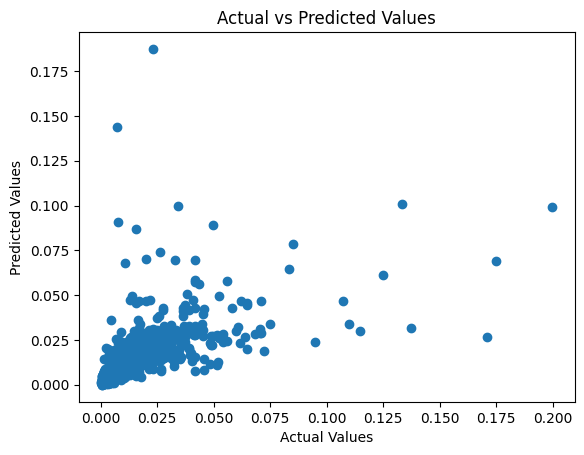

In [ ]:
import matplotlib.pyplot as plt

y_pred = gbr.predict(X_test)

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [ ]:
param_grid_gbr = {
    'n_estimators': [100, 300],  # Number of trees
    'max_depth': [5, 10],  # Maximum depth of the trees
    'min_samples_split': [5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [10, 30]
}

grid_search_gbr = GridSearchCV(estimator=gbr, param_grid=param_grid_gbr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search_gbr.fit(X_train, y_train)

best_gbr = grid_search_gbr.best_estimator_
best_gbr

GradientBoostingRegressor(max_depth=10, min_samples_leaf=30,
                          min_samples_split=5, random_state=42)

In [ ]:
best_gbr.score(X_test, y_test)

0.5578748604832918

Considering that random forest preformed better, it suggests that bagging works better for the dataset than boosting. This can be due to high variance in the data which is controlled better in bagging than boosting.

## Ensemble of Tree Ensembles

**Voting**

In [ ]:
from sklearn.ensemble import VotingRegressor

In [ ]:
ensemble = VotingRegressor(
    [
        ("rf_regr", rf_regr),
        ("gbr", gbr)
    ]
)
ensemble.fit(X_train, y_train)

VotingRegressor(estimators=[('rf_regr',
                             RandomForestRegressor(max_depth=10,
                                                   max_features=0.8,
                                                   min_samples_leaf=10,
                                                   min_samples_split=10,
                                                   n_estimators=1000)),
                            ('gbr',
                             GradientBoostingRegressor(random_state=42))])

In [ ]:
ensemble.score(X_test, y_test)

0.5246121774537875

In [ ]:
mae = mean_absolute_error(y_test, ensemble.predict(X_test))
mae

0.0041217822618181705

As expected, the result of voting ensembling is the average of the two models used in this mehod.

Here, MAE can be unscaled so that they provide better insights. 'ensemble' can be replaced by any models above.

In [ ]:
models = {
    'rf_regr': rf_regr,
    'gbr': gbr,
    'ensemble': ensemble,
}

mae_results = []

# Getting the scaler
fitted_scaler_pipeline = preprocessor.named_transformers_['ppln_9']
fitted_scaler = fitted_scaler_pipeline.named_steps['encoder']


# Unscallig each model's results
for name, model in models.items():
    preds = model.predict(X_test)
    preds_unscaled = fitted_scaler.inverse_transform(preds.reshape(-1, 1)).ravel()
    y_test_unscaled = fitted_scaler.inverse_transform(y_test.values.reshape(-1, 1)).ravel()

    mae = mean_absolute_error(y_test_unscaled, preds_unscaled)

    mae_results.append({'Model': name, 'MAE': mae})

# Creating a DataFrame
mae_df = pd.DataFrame(mae_results).sort_values(by='MAE')

print(mae_df)

      Model          MAE
0   rf_regr  4832.759928
2  ensemble  4945.644100
1       gbr  5300.261856


In [ ]:
y_test_unscaled.mean()

np.float64(13704.18)

Compared to the average car price, MAE is pretty high across all models.



**Stacking**

In [ ]:
from sklearn.ensemble import StackingRegressor

Meta model is designed in the from a linear regression model, since in stacking with just two estimators, meta model will only have access to the predictions of these estimators. This gives just two features to the meta model to train on. In this case, models that perform better with a small number of features like linear regression are best choices for being the meta model. After experimentation this speculation was proved. linear regression had a scroe of 0.48, however decision tree performed with 0.47 accuracy.

In [ ]:
# # Alternate option

# meta_model = LinearRegression()

# stacking_model = StackingRegressor(
#     estimators=[('rf_regr', rf_regr), ('gbr', gbr)],
#     final_estimator=meta_model
# )

In [ ]:
meta_model = DecisionTreeRegressor(max_depth = 20, min_samples_leaf = 50, min_samples_split = 2)

stacking_model = StackingRegressor(
    estimators=[('rf_regr', rf_regr), ('gbr', gbr)],
    final_estimator=meta_model
)

In [ ]:
stacking_model.fit(X_train, y_train)

StackingRegressor(estimators=[('rf_regr',
                               RandomForestRegressor(max_depth=10,
                                                     max_features=0.8,
                                                     min_samples_leaf=10,
                                                     min_samples_split=10,
                                                     n_estimators=1000)),
                              ('gbr',
                               GradientBoostingRegressor(random_state=42))],
                  final_estimator=DecisionTreeRegressor(max_depth=20,
                                                        min_samples_leaf=50))

In [ ]:
stacking_model.score(X_train, y_train)

0.47870808536409815

In [ ]:
mae = mean_absolute_error(y_test, stacking_model.predict(X_test))
mae

0.004273035084243522

## Feature Importance

**Permutation Importance**

In [ ]:
from sklearn.inspection import permutation_importance

To have a balance between computation resources and reliable results, n_repeats is set to 25. However, since we have a large dataset, a large value like 30 or more is advisable.
Because understanding variance in errors is more useful for us in our model than the mean absolute error of our model, "scoring" argument is set to 'neg_mean_absolute_error' here.

In [ ]:
perm_importance = permutation_importance(
    rf_regr, X_test, y_test, n_repeats=25, random_state=0, scoring='r2'
)

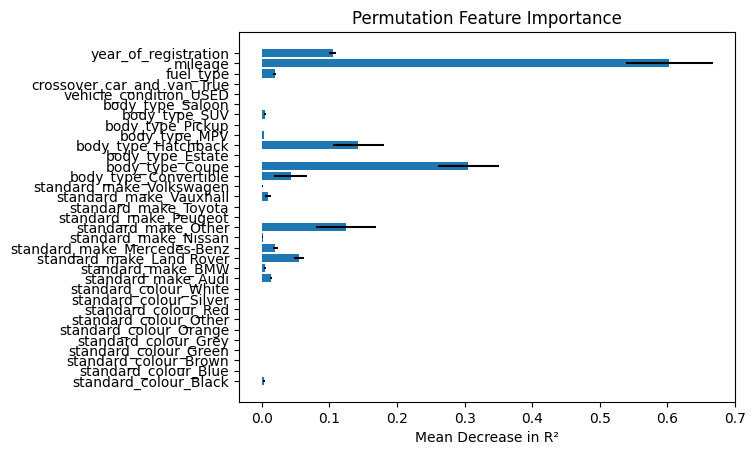

In [ ]:
importances = perm_importance.importances_mean
std = perm_importance.importances_std

# Get feature names (if available)
features = X_test.columns  # Assuming your X_test is a DataFrame

plt.barh(features, importances, xerr=std)
plt.xlabel('Mean Decrease in R²')
plt.title('Permutation Feature Importance')
plt.show()

In [ ]:
perm_importance_df = pd.DataFrame(
    dict(
        feature=X_test.columns,
        pi_mean=perm_importance['importances_mean'],
        pi_std=perm_importance['importances_std']
    )
)

perm_importance_df

,feature,pi_mean,pi_std
0,standard_colour_Black,3.113192e-03,1.209810e-03
1,standard_colour_Blue,1.069070e-04,2.934358e-04
2,standard_colour_Brown,0.000000e+00,0.000000e+00
3,standard_colour_Green,0.000000e+00,0.000000e+00
4,standard_colour_Grey,1.686759e-04,1.659649e-04
5,standard_colour_Orange,0.000000e+00,0.000000e+00
6,standard_colour_Other,-3.364589e-06,1.244376e-05
7,standard_colour_Red,1.362770e-04,8.391525e-05
8,standard_colour_Silver,8.885756e-05,6.928917e-05
9,standard_colour_White,1.657427e-04,7.268650e-05


Conclusion: It is clear that "mileage" is chosen as the most important feature in our random forest regressor model. This is also clear in the table, as it has the highest pi_mean in the 31th place.

**SHAP**

In [ ]:
import shap

In [ ]:
explainer = shap.Explainer(rf_regr, X_train)

In [ ]:
explanations = explainer(X_test, check_additivity=False)

100%|===================| 1998/2000 [08:00<00:00]       

Local Explanation

 A waterfall plot is created to explain the SHAP values (feature contributions) for the first row of test data.

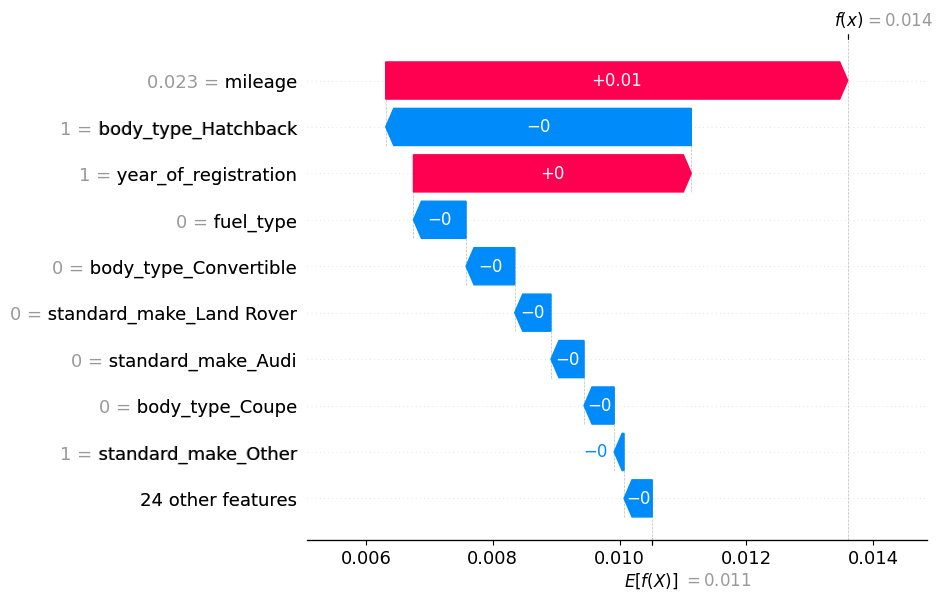

In [ ]:
row_idx = 0
shap.plots.waterfall(explanations[row_idx])

The waterfall indicates "mileage" has the most significant impact on the expected output of the model.

All of the contributions of the features appear to be approximated to zero, despite variations in the lengths of their corresponding bars. To ascertain the precise values, it is necessary to reference the exact unrounded figures.

In [ ]:
row_idx = 0
# Get base value and SHAP values for one instance
print("Base value:", explanations[row_idx].base_values)
print("SHAP values:", explanations[row_idx].values)
print("Feature values:", explanations[row_idx].data)
print("Feature names:", explanations.feature_names)

Base value: 0.010514234930687117
SHAP values: [-9.59987928e-05 -9.06425302e-06  0.00000000e+00  0.00000000e+00
 -3.69803194e-05  0.00000000e+00 -4.52654785e-08  1.20348912e-05
  1.00058397e-07 -1.39308230e-04 -5.21688234e-04 -6.15939921e-05
 -5.71512306e-04 -6.28237611e-05  1.13359317e-05 -1.55192595e-04
  7.84887391e-07  3.33728933e-06  1.09998090e-04 -1.06801512e-04
 -7.67364752e-04 -4.75226728e-04  3.93678934e-06 -4.81823497e-03
  2.25978546e-05  0.00000000e+00 -7.50475519e-05 -2.08760731e-05
  0.00000000e+00  0.00000000e+00 -8.29015129e-04  7.28409953e-03
  4.38095441e-03]
Feature values: [0.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         1.         0.
 0.         0.02307692 1.        ]
Feature names: ['standard_colour_Black', 'standard_colour_Blue', 'stan

The data presented demonstrates that the majority of the values examined are insubstantial in magnitude, leading to their rounding to zero, despite the variations in their respective bar lengths. This discrepancy can be attributed to the rounding convention employed.

## SHAP/PDP Model Explanations

Global Explanation

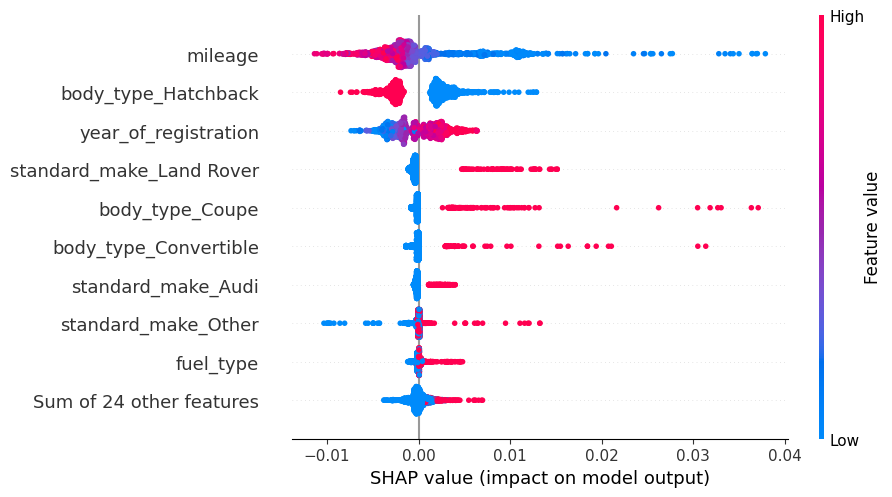

In [ ]:
shap.plots.beeswarm(explanations)

In the beeswarm plot, it is clear 'mileage' and 'body_type_Coupe' play the most important part in the predictions as their SHAP values are scattered across the x axis, not clustered around 0 value. In addition, the plot also indicates low values of 'mileage' has more impact (shap value) on the predictins than high values. Likewise, it indicates high values of "body_type_Coupe" are impactful, which means when this feature equals to 1. The number of SHAP values should also be considered as just variance cannot show the importance of a feature. There should be high numbers of them so it means that feature is effective.

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

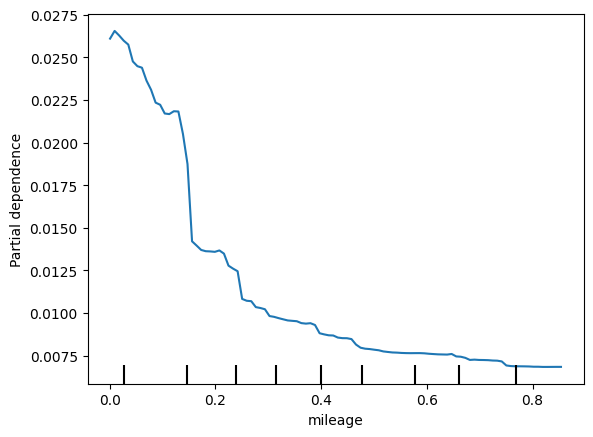

In [ ]:
PartialDependenceDisplay.from_estimator(
    rf_regr, X_test, features=['mileage'], kind='average'
);

It is clear by increasing "mileage" of the car, its impact on the price gets lower. After approximately 0.25 mileage, the increase in mileage does not have as much impact in lower than 0.25 mileage. This again proves the previous exploration in the SHAP beeswarm explanation that low values of 'mileage' have more impact on predictions than high values.

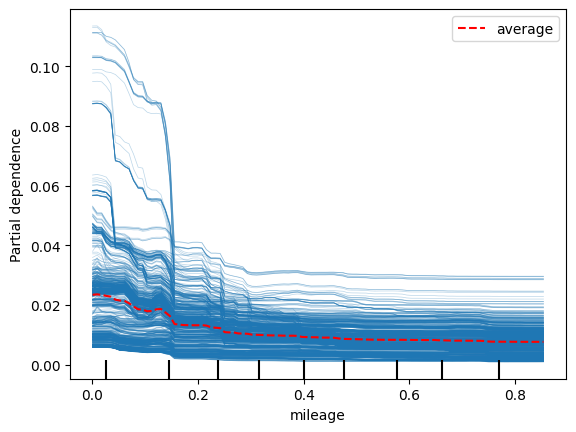

In [ ]:
PartialDependenceDisplay.from_estimator(
    rf_regr, X_test, features=['mileage'], kind='both', pd_line_kw={'color': 'red'}
);

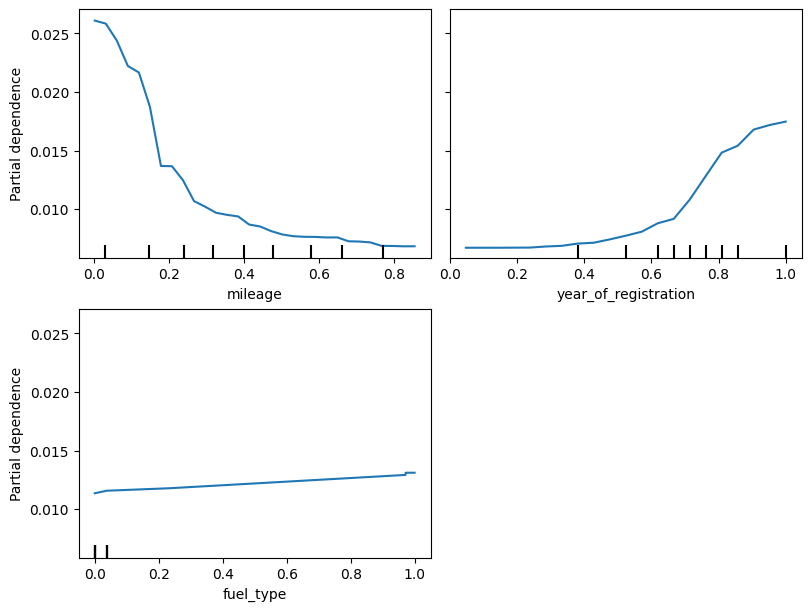

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rf_regr, X_test, features=['mileage', 'year_of_registration', 'fuel_type'],
    kind='average',
    subsample=100, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

In contrast to "mileage", year of registration of cars corresponding to higher values have more impact on the price of a car than that of lower values.

# Part II

## Dimensionality Reduction (Linear)

**PCA**

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

Our dataset has already been scaled.

In [ ]:
X_copy_2 = X_subset.copy()
pca_full = PCA(n_components=10)
X_pca_10d = pca_full.fit_transform(X_copy_2)
explained_variance = pca_full.explained_variance_ratio_
print("Explained variance for 10 components:")
for i, ev in enumerate(explained_variance, 1):
    print(f"PC{i}: {ev:.3f}")

Explained variance for 10 components:
PC1: 0.138
PC2: 0.108
PC3: 0.085
PC4: 0.072
PC5: 0.066
PC6: 0.062
PC7: 0.058
PC8: 0.039
PC9: 0.038
PC10: 0.038


Almost 70% (the sum of the variance explained by all PCAs) of the total variance of the original data is captured by the newly generated features, the rest of is lost. Since it keeps most of the variance, there is no need for increasing components.

Testing if newley generated features can help the performance of the model.

In [ ]:
from sklearn.model_selection import train_test_split
X_pca_10d_train , X_pca_10d_test, y_pca_10d_train, y_pca_10d_test = train_test_split(X_pca_10d, y_subset, test_size=0.2, random_state=42)

In [ ]:
rf_regr_PC = RandomForestRegressor(
    n_estimators=1000,
    max_depth=5, min_samples_split=20, min_samples_leaf=20,
    max_features=0.8
)

In [ ]:
rf_regr_PC.fit(X_pca_10d_train, y_pca_10d_train)

RandomForestRegressor(max_depth=5, max_features=0.8, min_samples_leaf=20,
                      min_samples_split=20, n_estimators=1000)

In [ ]:
rf_regr_PC.score(X_pca_10d_test, y_pca_10d_test)

0.3364398374066758

The performance falls a lot with new features of PCA linear dimensionality reduction. So, the random forest has a lower ability to maneuver between features and arrives at the target.



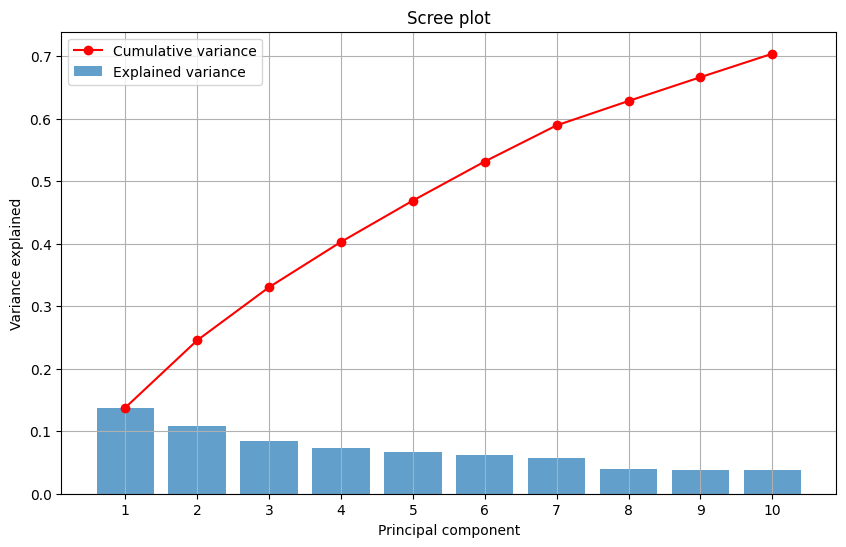

In [ ]:
explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
plt.figure(figsize=(10, 6))
plt.bar(range(1, 11), explained_variance, alpha=0.7, label='Explained variance')
plt.plot(range(1, 11), cumulative_variance, 'ro-', label='Cumulative variance')
plt.xlabel('Principal component')
plt.ylabel('Variance explained')
plt.title('Scree plot')
plt.xticks(range(1, 11))
plt.legend()
plt.grid(True)
plt.show()

The explained variance of each PC is clear. Increasing components still increases the explained variance. However, it seems from 9th and 10th components, the increase in explained variance is too low that we can take these points as the elbow point.

With two components:

In [ ]:
X_copy_4 = X_subset.copy()
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_copy_4)

# Create a DataFrame for plotting
df_pca = pd.DataFrame(X_pca_2d, columns=['PC1', 'PC2'])
df_pca['price'] = y_subset.reset_index(drop=True)

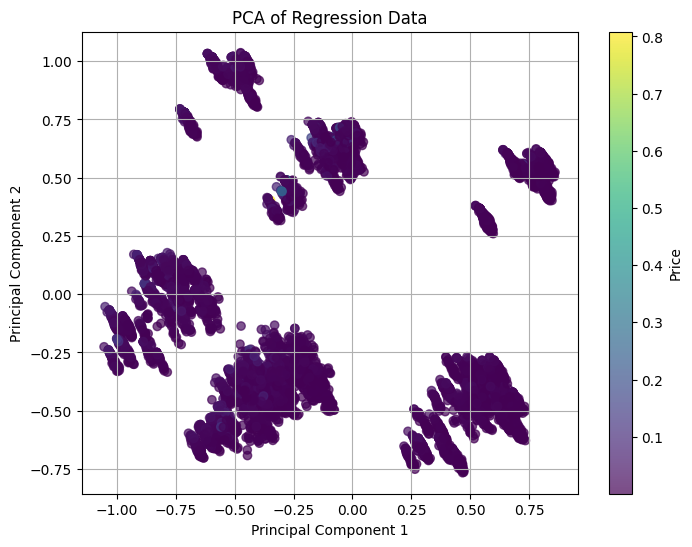

In [ ]:
plt.figure(figsize=(8, 6))
scatter = plt.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['price'], cmap='viridis', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Regression Data')
plt.colorbar(scatter, label='Price')  # Color mapping of the target variable
plt.grid(True)
plt.show()

There are some clusters which show the price is correlated with some particular PC1 and PC2 values. But, there is not any large insightful point, especially because all data has the same price.

Log-scalling the price to have a better insight from its distribution. It justifies why in PCA plot all data has low values. Because the data produced after preprocessing has mostly kept low values of price. In the preprocessing, data points with low occurrences were cleared. This shows that high price was mostly for special cars which was occurred in the data rarely, and in the preprocessing they were removed.

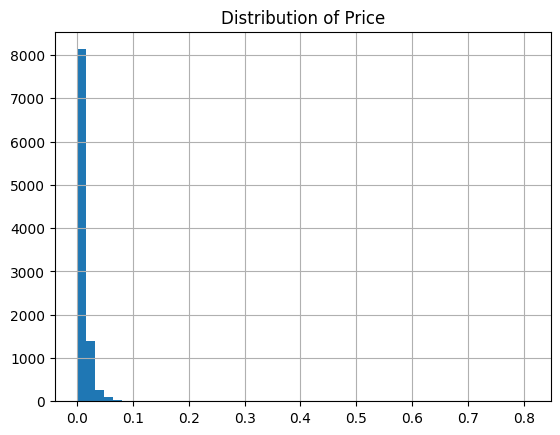

In [ ]:
df_pca['price'].hist(bins=50)
plt.title("Distribution of Price")
plt.show()

## Dimensionality Reduction (Non-Linear)

**Isomap**

Isomap is implemented on the data produced by SelectKBest feature importance method as that data has a better chance to have underlying patterns than normal data.

In [ ]:
from sklearn.manifold import MDS, Isomap, TSNE

Converting data from the form of numpy array to data frame.

In [ ]:
X_train_sel_1_df = pd.DataFrame(X_train_sel_1, columns=X_train.columns[selector_train_1.get_support()])

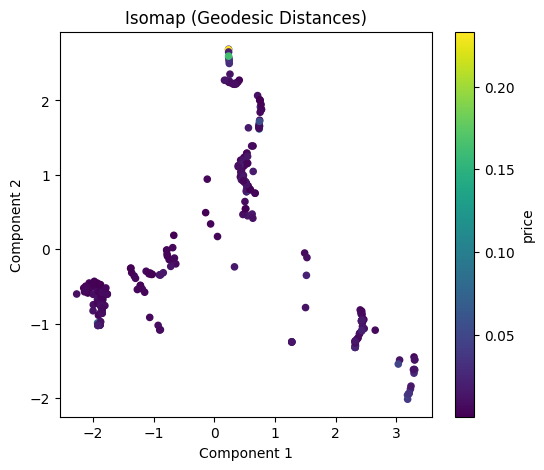

In [ ]:
np.random.seed(42)
subset = np.random.choice(len(X_train_sel_1_df), 300, replace=False)
X_train_sub, y_train_sub = X_train_sel_1_df.iloc[subset], y_train.iloc[subset]


# Isomap with 15 neighbors
isomap = Isomap(n_components=2, n_neighbors=15)
X_iso = isomap.fit_transform(X_train_sub)


plt.figure(figsize=(6, 5))
plt.scatter(X_iso[:, 0], X_iso[:, 1], c=y_train_sub.values, cmap='viridis', s=20)
plt.title("Isomap (Geodesic Distances)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar(label='price')
plt.show()

Some patterns can be drawn from the plot.

**t-SNE**

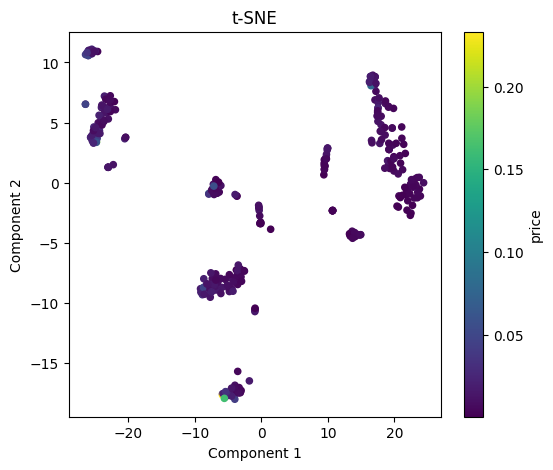

In [ ]:
np.random.seed(42)
subset = np.random.choice(len(X_train_sel_1_df), 300, replace=False)
X_train_sub, y_train_sub = X_train_sel_1_df.iloc[subset], y_train.iloc[subset]


# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_train_sub)


# Plot Isomap results
plt.figure(figsize=(6, 5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_train_sub.values, cmap='viridis', s=20)
plt.title("t-SNE")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar(label='price')
plt.show()

Again, some patterns is clear.

## Polynomial Regression

To apply more advanced regression methods, Polynomial Regression has some advantages over other methods:  
1- The target variable (price) is a continous data.  
2- GLMs are for special kind of regressions where target variable has a special kind of distribution. However, our data is continous data and we assume their distribution to be normal.

These advantages are also shown in the results were polynomial makes the model prediction improve, but Bayesian cannot.

**Polynomial Regression**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

To compare the normal linear regressin with polynomial version, their performance is calculated and visualized here.


Linear Regression - MAE: 0.0057, R²: 0.3844
Polynomial Regression (degree=2) - MAE: 0.0048, R²: 0.5340


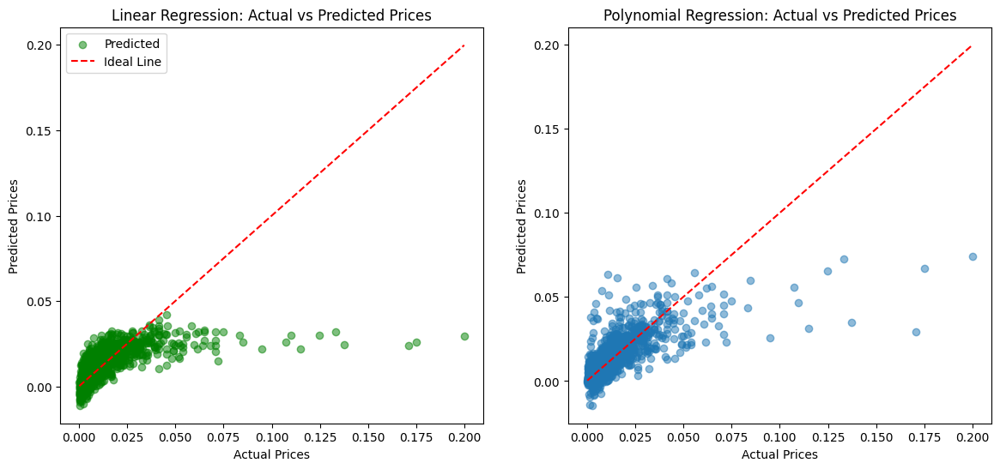

In [ ]:
lr_normal = LinearRegression()
lr_normal.fit(X_train, y_train)

y_pred_normal = lr_normal.predict(X_test)

mae_normal = mean_absolute_error(y_test, y_pred_normal)
r2_normal = r2_score(y_test, y_pred_normal)

print(f"Linear Regression - MAE: {mae_normal:.4f}, R²: {r2_normal:.4f}")

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_normal, alpha=0.5, color='green', label='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ideal Line')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Linear Regression: Actual vs Predicted Prices")
plt.legend()





poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

lr_poly = LinearRegression()
lr_poly.fit(X_train_poly, y_train)

y_pred_poly = lr_poly.predict(X_test_poly)

mae_poly = mean_absolute_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)

print(f"Polynomial Regression (degree=2) - MAE: {mae_poly:.4f}, R²: {r2_poly:.4f}")

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_poly, alpha=0.5, label='Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ideal Line')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Polynomial Regression: Actual vs Predicted Prices")
plt.show()

It is clear that polynomial linear regression performs better. It is becuase it has gathered points around a point by reducing variance. This is also shown in its R² score, which is almost 0.15 higher than normal linear regression.

**Bayesian Regression**

In [ ]:
!pip install pymc arviz
import pymc as pm
import arviz as az
from sklearn.metrics import mean_absolute_error, r2_score

Assumptions:  
1. Due to the high number of columns in the original preprocessed data, Bayessian regression is implemented on the data genertaed by SelectKBest feature selection method.
2. Alpha, betas, and y_train are assumed to follow a normal distribution.  
3. Both alpha and betas have a mean (mu) of 0 and a standard deviation (sigma) of 10.  
These initial assumptions may be adjusted based on how well the parameters fit the y_train data. A total of 2000 samples with various combinations of alpha, betas, and sigma are generated. These samples will create a trace and distribution that illustrate the behavior and distribution of each parameter.

Output()

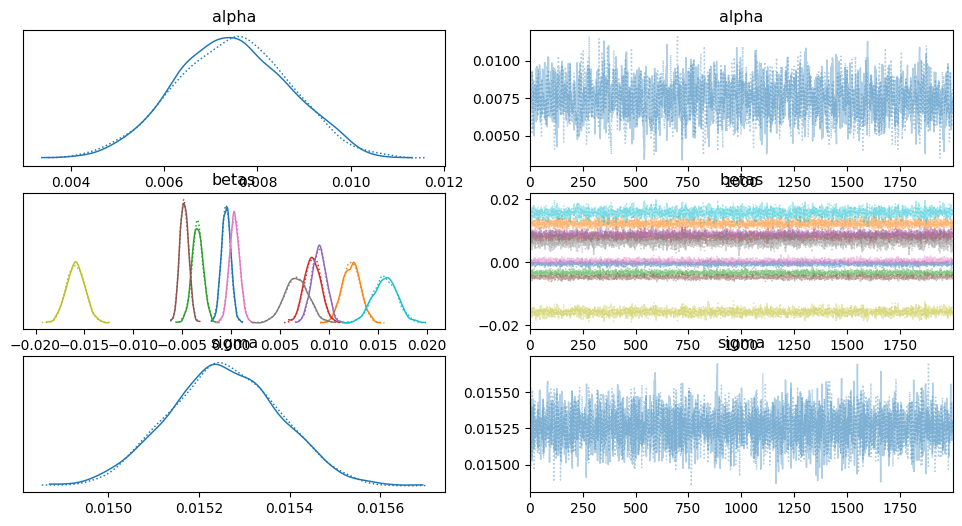

In [ ]:
with pm.Model() as model:
    # Priors for intercept and coefficients
    alpha = pm.Normal("alpha", mu=0, sigma=10)
    betas = pm.Normal("betas", mu=0, sigma=10, shape=X_train_sel_1.shape[1])

    # Linear model
    mu = alpha + pm.math.dot(X_train_sel_1, betas)

    # Prior for error term (noise)
    sigma = pm.HalfNormal("sigma", sigma=10)

    # Likelihood
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y_train)

    # Sampling from posterior
    trace = pm.sample(draws=2000, tune=2000, target_accept=0.9, discard_tuned_samples=False)

pm.plot_trace(trace)
plt.show()

The distribution and trace plots show:  
1- Alpha: Both distributions and chains are consistent and mixed together at around 0.0075.  
2- Betas: In the distribution plots, some parameters have sharp and some are widely spread. For each features, chains in trace plots are convergent and show their values.  
3- Sigma also looks OK, likely around 0.01525.

We make predictions based on these samples with X_test_sel_1, which gives y_pred for each sample and y_pred_mean for the mean of all samples for each point.

In [ ]:
posterior = az.extract(trace)
alpha_samples = posterior["alpha"].values
betas_samples = posterior["betas"].values


if betas_samples.shape[1] != X_test_sel_1.shape[1]:
    betas_samples = betas_samples.T


# Predictive mean for each test point
y_pred = alpha_samples[None, :] + np.dot(X_test_sel_1, betas_samples.T)
y_pred_mean = y_pred.mean(axis=1)


r2_bayesian = r2_score(y_test, y_pred_mean)
mae_bayesian = mean_absolute_error(y_test, y_pred_mean)
print(f"Bayesian Regression - R²: {r2_bayesian:.2f}, MAE: {mae_bayesian:.2f}")

Bayesian Regression - R²: 0.36, MAE: 0.01


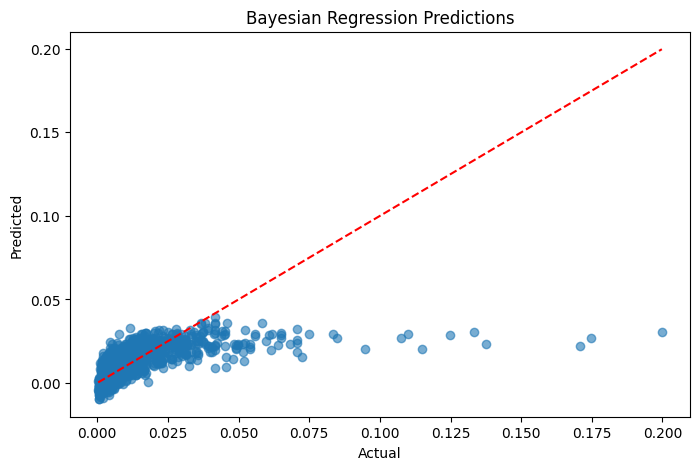

In [ ]:
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred_mean, alpha=0.6)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Bayesian Regression Predictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.show()

The plot and accuracy score shows that the Bayesian regressor performs almost like normal linear regressor. There is no noticeable improvement.

## Clustering for Feature Engineering

**K-means Clustering**

First, the best value for the number of clusters (k) is found with elbow method.

In [ ]:
!pip install kneed
from kneed import KneeLocator
from sklearn.cluster import KMeans

In [ ]:
X_copy = X_subset.copy()
y_copy = y_subset.copy()
inertia = []
K = range(1, 11)
for k in K:
  kmeans = KMeans(n_clusters=k, random_state=42)
  kmeans.fit(X_copy)
  inertia.append(kmeans.inertia_)



kl = KneeLocator(K, inertia, curve='convex', direction='decreasing')
optimal_k = kl.elbow
print(f"The optimal number of clusters is: {optimal_k}")

The optimal number of clusters is: 3


In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0)
cluster_labels = kmeans.fit_predict(X_copy)

In [ ]:
X_copy['Cluster_K_Means'] = cluster_labels

Visualizing the clusters to find out if they represent special groups:

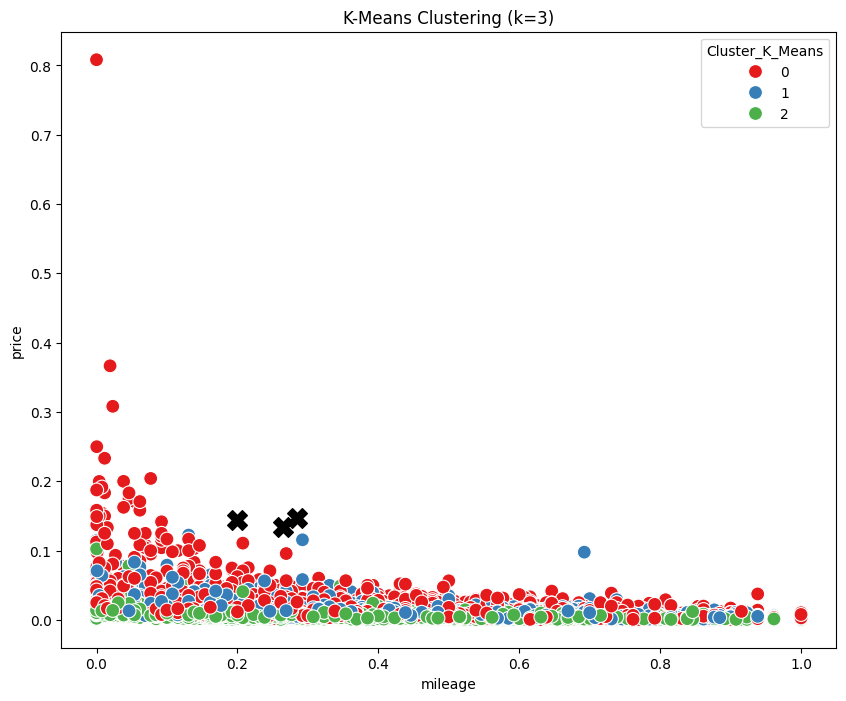

In [ ]:
# Plotting the clusters
df_plot = pd.concat([X_copy, y_copy], axis=1)
plt.figure(figsize=(10, 8))
sns.scatterplot(x='mileage', y='price', hue='Cluster_K_Means', data=df_plot, palette='Set1', s=100)



centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, marker='X', label='Centroids')



plt.title("K-Means Clustering (k=3)")
plt.show()

Clusters are represented by their price and mileage. It is a clear indication that as mileage increases, the price tends to decrease.

Checking the relationship between year_of_registration and price with the help of clusters:

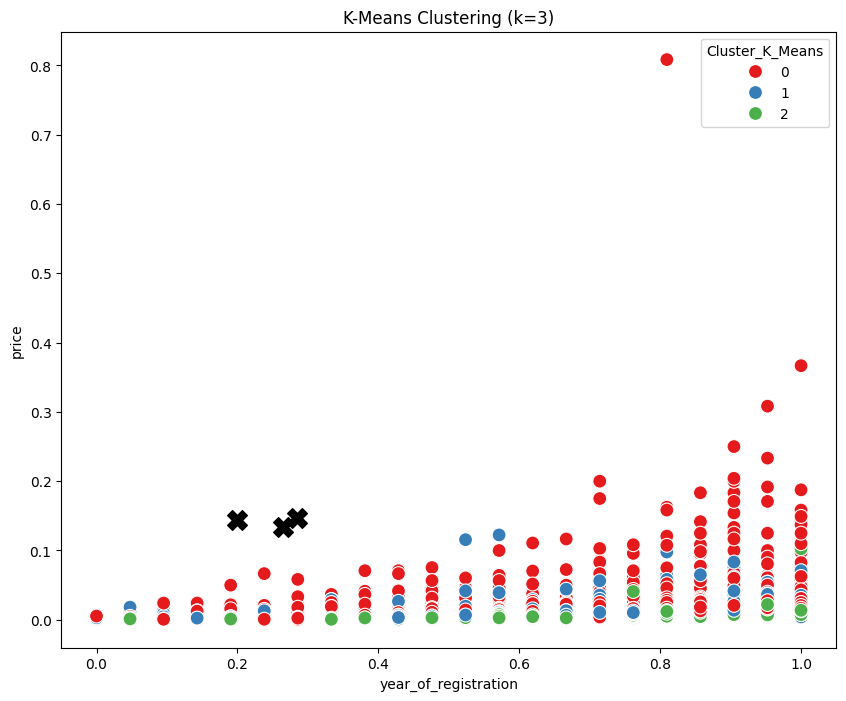

In [ ]:
# Plotting the clusters
df_plot = pd.concat([X_copy, y_copy], axis=1)
plt.figure(figsize=(10, 8))
sns.scatterplot(x='year_of_registration', y='price', hue='Cluster_K_Means', data=df_plot, palette='Set1', s=100)



centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, marker='X', label='Centroids')



plt.title("K-Means Clustering (k=3)")
plt.show()

It is clear high values of year_of_registration have higher prices, and cars in cluster 0 (red) are more expensive.

Evaluating the impact of the newly generated clusters column on predictive performance of the model:

In [ ]:
ppln_11 = create_cat_pp_ppln(X_copy[["Cluster_K_Means"]], encode_method='onehot')


cluster_encoded = ppln_11.fit_transform(X_copy[["Cluster_K_Means"]])


encoded_cluster = pd.DataFrame(
    cluster_encoded,
    columns=ppln_11.get_feature_names_out(["Cluster_K_Means"]),
    index=X_copy.index
)


X_copy = X_copy.drop(columns=["Cluster_K_Means"])
X_copy = pd.concat([X_copy, encoded_cluster], axis=1)

In [ ]:
X_copy.head()

,standard_colour_Black,standard_colour_Blue,standard_colour_Brown,standard_colour_Green,standard_colour_Grey,standard_colour_Orange,standard_colour_Other,standard_colour_Red,standard_colour_Silver,standard_colour_White,...,body_type_SUV,body_type_Saloon,vehicle_condition_USED,crossover_car_and_van_True,fuel_type,mileage,year_of_registration,Cluster_K_Means_0,Cluster_K_Means_1,Cluster_K_Means_2
335825,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.000000,0.576923,0.428571,0.0,0.0,1.0
363164,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.000000,0.353846,0.714286,0.0,0.0,1.0
349474,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,1.0,0.0,0.037157,0.461538,0.761905,0.0,1.0,0.0
360317,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.037157,0.284615,0.571429,0.0,0.0,1.0
320782,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.037157,0.315385,0.761905,1.0,0.0,0.0


In [ ]:
X_copy_train, X_copy_test, y_copy_train, y_copy_test = train_test_split(X_copy, y_copy, test_size=0.2, random_state=42)

In [ ]:
rf_regr_2 = RandomForestRegressor(
    n_estimators=1000,
    max_depth=5, min_samples_split=20, min_samples_leaf=20,
    max_features=0.8
)

In [ ]:
rf_regr_2.fit(X_copy_train, y_copy_train)

RandomForestRegressor(max_depth=5, max_features=0.8, min_samples_leaf=20,
                      min_samples_split=20, n_estimators=1000)

In [ ]:
rf_regr_2.score(X_copy_test, y_copy_test)

0.4973567056832944

The findings indicate that the introduction of newly engineered features derived from the clusters did not lead to an enhancement in the model's performance.

**Agglomerative Clustering**



The dataset in question is substantial, and the application of Agglomerative Clustering presents challenges due to its computational intensity. This method generates a distance matrix comprising n² distances, which can lead to significant resource consumption. Consequently, even when dealing with a modest number of features, Agglomerative Clustering may prove impractical for effective data analysis.

**DBSCAN (Density-Based Clustering)**

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

Finding the optimal EPS. As the dataset is large, the number of neighbors to calculate the distance from is chosen as 30.

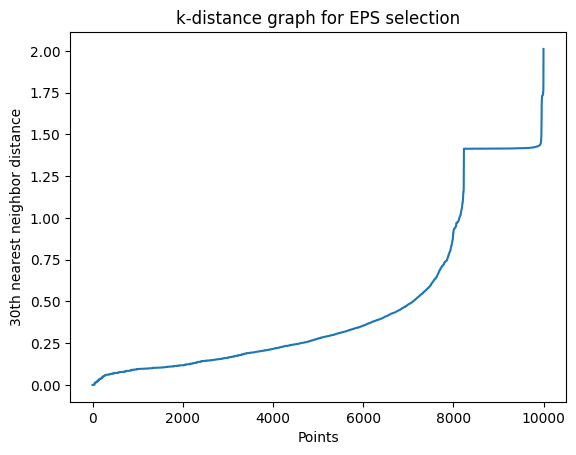

In [ ]:
X_copy_3 = X_subset.copy()
y_copy_3 = y_subset.copy()
neigh = NearestNeighbors(n_neighbors=20)
nbrs = neigh.fit(X_copy_3)
distances, _ = nbrs.kneighbors(X_copy_3)



distances = np.sort(distances[:, -1], axis=0)
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("30th nearest neighbor distance")
plt.title("k-distance graph for EPS selection")
plt.show()

The analysis of the plot indicates that a value of 0.75 is appropriate for the epsilon (EPS) parameter in our clustering framework. This selection is optimal because it strikes a balance; it is sufficiently small to ensure that the 30th point remains accessible to most other points, facilitating meaningful cluster formation. At the same time, this value is not excessively large, which prevents distant points from being erroneously included in the same clusters.

Since the dataset is large, a high number like 30 is chosen for the minimum points to form a cluster so that maybe a clear pattern can be driven as the result.

The number of generated clusters: 92


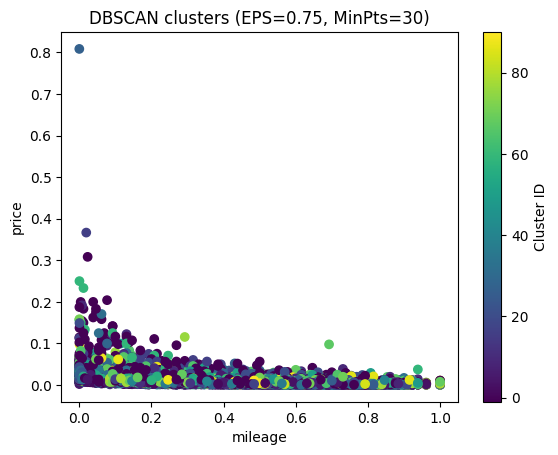

In [ ]:
db = DBSCAN(eps=0.75, min_samples=30)
clusters = db.fit_predict(X_copy_3)


X_copy_3["Cluster"] = clusters
print(f"The number of generated clusters: {len(X_copy_3['Cluster'].unique())}")


plt.scatter(X_copy_3["mileage"], y_copy_3, c=clusters, cmap="viridis")
plt.xlabel("mileage")
plt.ylabel("price")
plt.title("DBSCAN clusters (EPS=0.75, MinPts=30)")
plt.colorbar(label="Cluster ID")
plt.show()

92 clusters have been generated, with a significant majority exhibiting low cluster IDs. However, the analysis reveals a lack of discernible patterns that could effectively differentiate these clusters from one another. As a result, it is challenging to draw any definitive conclusions based on the current clustering outcomes.